In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import special as sp
from scipy import stats
from enum import Enum
import csv
import random
import json

In [2]:
class Environment(Enum):
  FREE_SPACE = 0,
  URBAN_AREA_CELLULAR_RADIO = 1,
  SHADOWED_URBAN_CELLULAR_RADIO = 2,
  IN_BUILDING_LINE = 3,
  OBSTRUCTED_IN_BUILDING = 4,
  OBSTRUCTED_IN_FACTORY = 5

In [3]:
def dB2Veces(potencia):
    return pow(10, potencia/10)

In [4]:
def dBm2pot(dbm):
    return pow(10, dbm/10)*1e-3

In [5]:
def qfunc(x):
    ## Función Q, calculada con la función de error.
    return 0.5-0.5*sp.erf(x/np.sqrt(2))

In [6]:
def get_SNRPerSimbol(snr, bw, sps):
    ## snr: SNR de la señal en el receptor.
    ## bw: Ancho de banda de la señal.
    ## sps: símbolos por segundo. 
    snr = dB2Veces(snr)
    return snr*bw/sps 

In [7]:
def get_SimbolsPerSecond(bw, gi):
    ## bw: Ancho de banda de la señal.
    ## gi: Guard interval(Evita ISI(Interferencia inter-simbólica) por rebotes de la señal).
    periodo = 1/bw
    new_periodo = periodo + gi
    return 1/new_periodo

In [8]:
def get_SER(m, snr, bw, gi):
    ## m: Número de M-QAM
    ## snr: SNR de la señal en el receptor.
    ## bw: Ancho de banda de la señal.
    ## gi: Guard interval(Evita ISI(Interferencia inter-simbólica) por rebotes de la señal).
    sps = get_SimbolsPerSecond(bw, gi)
    gamma = get_SNRPerSimbol(snr, bw, sps) ## gamma_simb = 2*gamma_bit <--- cambiar
    #print("Gamma: ", gamma)
    
    return 1-pow((1-(2*(np.sqrt(m)-1)/np.sqrt(m))*qfunc(np.sqrt(3*gamma/(m-1)))), 2)

In [9]:
def get_PER(n, m, snr, bw, gi):
    ## n: N° de bits en un paquete
    ## m: Número de M-QAM
    ## snr: SNR de la señal en el receptor.
    ## bw: Ancho de banda de la señal.
    ## gi: Guard interval(Evita ISI(Interferencia inter-simbólica) por rebotes de la señal).
    ps = get_SER(m, snr, bw, gi)
    ## n_spp: N° de símbolos en un paquete
    n_spp = int(n/np.log2(m))
    #print("SER: ", ps, "\nN° símbolos por paquete: ", n_spp)
    return 1-pow((1-ps), n_spp)

In [10]:
def get_friis_propagation(pt, d, longOnda, ple):
    ## pt: Potencia del transmisor. 
    ## d: Distancia hacia el receptor.
    ## longOnda: Longitud de onda de la portadora.
    ## ple: Path Loss Exponent
    friis = (pt*(longOnda**2)/(((4*np.pi)**2)*((d)**ple)))   
    return 10*np.log10(friis/1e-3)

In [11]:
## return: Potencia de recepcion
def get_2_ray_propagation(pt, d, ht, hr):
    ## pt: Potencia del transmisor. 
    ## d: Distancia hacia el receptor.
    ## ht: Altura de transmisora
    ## hr: Altura de receptora
    L=1
    return 10*np.log10(((pt*(ht**2)*(hr**2))/(d**4)*L)/1e-3)

In [12]:
def get_exponent_by_enviroment(enviroment):
    ## Obtención de exponentes según ambiente.
    if(enviroment == Environment.FREE_SPACE):
        return 2
    elif( enviroment == Environment.URBAN_AREA_CELLULAR_RADIO):
        return random.uniform(2.7, 3.5)
    elif( enviroment == Environment.SHADOWED_URBAN_CELLULAR_RADIO):
        return random.uniform(3.0, 5.0)
    elif( enviroment == Environment.IN_BUILDING_LINE):
        return random.uniform(1.6, 1.8)
    elif( enviroment == Environment.OBSTRUCTED_IN_BUILDING):
        return random.uniform(4.0, 6.0)
    elif( enviroment == Environment.OBSTRUCTED_IN_FACTORY):
        return random.uniform(2.0, 3.0)

In [13]:
pr = get_friis_propagation(1,1000, 0.33, 2)
print(f"Potencia en el receptor: {pr}[dBm]")

Potencia en el receptor: -61.61391848288417[dBm]


In [14]:
PER = get_PER(1e3, 16, 10, 1e6, 8e-6)
print(PER)

0.008249787181468404


In [15]:
def get_stdRandNum():
    ## Retorna un número random distribuído en una normal estándar.
    return np.random.standard_normal()

In [16]:
def isThisPacketWrong(PER):
    ## Determina si el paquete está errado si el número random cae dentro de las áreas perifericas determinadas por PER/2.
    area_baja = stats.norm.ppf(PER/2)
    area_alta = stats.norm.ppf(1 - PER/2)
    num = get_stdRandNum()
    if num < area_baja or num > area_alta:
        return True
    else:
        return False

In [17]:
count = 0
max_num = 10000
for i in range(max_num):
    if isThisPacketWrong(PER):
        count +=1
print(f"N° de paquetes con bits errados: {count}\n", f"Probabilidad de PER experimental: {count/max_num}")

N° de paquetes con bits errados: 98
 Probabilidad de PER experimental: 0.0098


In [18]:
def get_RxSNR(S, N):
    ## Obtiene SNR en el receptor.
    S = dB2Veces(S)
    N = dB2Veces(N)
    SNR = S/N
    return 10*np.log10(SNR)

In [19]:
def manualSimulator(max_iter, env, dist, n_bits, bw, gi):
    p_tx = 30 # [dBm] Potencia Tx
    p_min = -86 # [dBm] Sensibilidad del receptor
    #p_noise = -70 # [dBm] Ruido < --- **Justificar**
    #print(dBm2pot(p_tx), p_inRx)
    errs = 0
    count = 0
    while count != max_iter:

        p_noise = -(random.gauss(80, 10))

        exp = get_exponent_by_enviroment(env)
        p_inRx = get_friis_propagation(dBm2pot(p_tx), dist, 0.33, exp)
        
        if p_inRx < p_min:
            errs +=1
        else:
            Rx_SNR = get_RxSNR(p_inRx, p_noise)
            #print(Rx_SNR)
            PER = get_PER(n_bits, 16, Rx_SNR, bw, gi)
            #print(f"PER: {PER}")
            if PER != 0:
                 if isThisPacketWrong(PER):
                        errs +=1

        count +=1
    print(f"N° paquetes errados: {errs}, N° total de paquetes {max_iter}, Tasa de trasmisión efectiva: {(max_iter - errs)/max_iter}")

In [20]:
manualSimulator(10000, Environment.FREE_SPACE, 250, 1e3, 1e6, 8e-6)

N° paquetes errados: 92, N° total de paquetes 10000, Tasa de trasmisión efectiva: 0.9908


In [21]:
def simulator(max_iter):
    p_tx = 30 # [dBm] Potencia Tx
    p_min = -86 # [dBm] Sensibilidad del receptor
    mu = 80 # -[dBm]
    sigma = 10 # -[dBm]
    canal_bw = [1e6, 2e6, 4e6, 8e6, 16e6] ## Canales BW
    dist_list = [1, 2, 3, 5, 7, 10,
                 20, 30, 50, 70, 100,
                 200, 300, 500, 700, 1000,
                 2000, 3000, 5000, 7000, 10000] ## Distancias 
    q_am = [2, 4, 16, 64, 256] ## BPSK, QPSK, 16QAM, 64QAM, 256QAM
    gi_list = [4e-6, 8e-6] ## Guard Interval
    n_bits = 1e3
    datos = {}
    errs = 0
    count = 0
    while count != max_iter:
        for env in Environment:
            #print(f"Environment: {env}")
            for gi in gi_list:
                #print(f"Guard Interval[s]: {gi}")
                for bw in canal_bw:
                    #print(f"Channel BW[Hz]: {bw}")
                    for q in q_am:
                        #print(f"N° de constelaciónes QAM: {q}")
                        calcular = True
                        for dist in dist_list:
                            if calcular:
                                errs = 0
                                count = 0
                                tasa_efectiva = 1
                                #print(f"Distancia al Rx[m]: {dist}")
                                while count != max_iter:
                                    #p_noise = -(np.random.normal(mu, sigma)) ## Demora más u.u
                                    p_noise = -(random.gauss(mu, sigma))

                                    exp = get_exponent_by_enviroment(env)
                                    p_inRx = get_friis_propagation(dBm2pot(p_tx), dist, 0.33, exp)
                                    
                                    if p_inRx < p_min:
                                        errs +=1
                                    else:
                                        Rx_SNR = get_RxSNR(p_inRx, p_noise)
                                        PER = get_PER(n_bits, q, Rx_SNR, bw, gi)
        
                                        if PER != 0:
                                             if isThisPacketWrong(PER):
                                                    errs +=1

                                    tasa_efectiva = (max_iter - errs)/max_iter
                                    count +=1

                                # print(f'''N° paquetes errados: {errs}
                                # N° total de paquetes {max_iter}
                                # Tasa de trasmisión efectiva: {tasa_efectiva}''')
                            
                            datos[(env, gi, bw, q, dist)] = tasa_efectiva
                            
                            if tasa_efectiva == 0.0:
                                calcular = False
                                
    return datos

In [22]:
%time datos = simulator(5e5)


Wall time: 2d 11h 27min 8s


In [23]:
def save_cvs(datos):
    ## Guarda los datos en un csv.
    canal_bw = [1e6, 2e6, 4e6, 8e6, 16e6] ## Canales BW
    dist_list = [1, 2, 3, 5, 7, 10,
                    20, 30, 50, 70, 100,
                    200, 300, 500, 700, 1000,
                    2000, 3000, 5000, 7000, 10000] ## Distancias 
    q_am = [2, 4, 16, 64, 256] ## BPSK, QPSK, 16QAM, 64QAM, 256QAM
    gi_list = [4e-6, 8e-6] ## Guard Interval
    data = {}
    a_file = open("Resultados/resultData.csv", "w")
    writer = csv.writer(a_file)

    for env in Environment:
            #print(env)
            data = {k: v for k, v in datos.items() if k[0]==env}
            #print(data)
            for gi in gi_list:
                for bw in canal_bw:
                    for q in q_am:
                        tmp = []
                        for dist in dist_list:
                            tmp.append(data[env, gi, bw, q, dist])
                            #print(data[env, gi, bw, q, dist])
                        
                        writer.writerow([env, gi, bw, q, dist_list,tmp])

        
    a_file.close()

In [24]:
save_cvs(datos)

In [25]:
def plotGraph(data_x, data_y, env, gi, bw, q):
    ## Genera gráfico de una configuración a todas las distancias.
    lenght = len(data_x)
    #x = np.linspace(0, lenght, num=lenght, endpoint=False) ## Equiespaciamos max_In en interval

    # Note that even in the OO-style, we use `.pyplot.figure` to create the figure.
    fig, ax = plt.subplots(figsize=(15,10))  # Create a figure and an axes.
    ax.plot(data_x, data_y, "-bo", label='Goodput')  # Plot some data on the axes.
    ax.set_xlabel('Distancia[m]')  # Add an x-label to the axes.
    ax.set_ylabel('Tasa efectiva paquetes(Goodput)')  # Add a y-label to the axes.
    ax.set_title(f"Goodput. vs Distancia[m]")  # Add a title to the axes.
    ax.legend()  # Add a legend.
    ax.text(6500, 1, f'\n{"#"*len(str(env))}\nAmbiente: {env}\n' +
           f'Guard Interval[us]: {gi/1e-6}\n' +
           f'Bw del canal[MHz]: {bw/1e6}\n' + 
           f'M-QAM: {q}', fontsize=12)
    for i in range(lenght):
        ax.annotate(str(data_x[i]), # this is the text
                     (data_x[i], data_y[i]), # these are the coordinates to position the label
                     textcoords="offset points", # how to position the text
                     xytext=(0,10), # distance from text to points (x,y)
                     ha='center') # horizontal alignment can be left, right or center
    fig.savefig(f'Resultados/Graficos/{env}{gi/1e-6}{bw/1e6}{q}.png', facecolor='white', transparent=False)


In [26]:
def plotAllGraphs(datos):
    ## Genera todos los gráficos con todas las configuraciones y ambientes.
    canal_bw = [1e6, 2e6, 4e6, 8e6, 16e6] ## Canales BW
    dist_list = [1, 2, 3, 5, 7, 10,
                 20, 30, 50, 70, 100,
                 200, 300, 500, 700, 1000,
                 2000, 3000, 5000, 7000, 10000] ## Distancias 
    q_am = [2, 4, 16, 64, 256] ## BPSK, QPSK, 16QAM, 64QAM, 256QAM
    gi_list = [4e-6, 8e-6] ## Guard Interval
    data = {}
    tmp = []
    for env in Environment:
        #print(env)
        data = {k: v for k, v in datos.items() if k[0]==env}
        for gi in gi_list:
            for bw in canal_bw:
                for q in q_am:
                    tmp = []
                    for dist in dist_list:
                        tmp.append(data[env, gi, bw, q, dist])
                    #print(tmp)
                    tmp = np.array(tmp)
                    plotGraph(dist_list, tmp, env, gi, bw, q)
                        

<ipython-input-25-caea98522bd0>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,10))  # Create a figure and an axes.


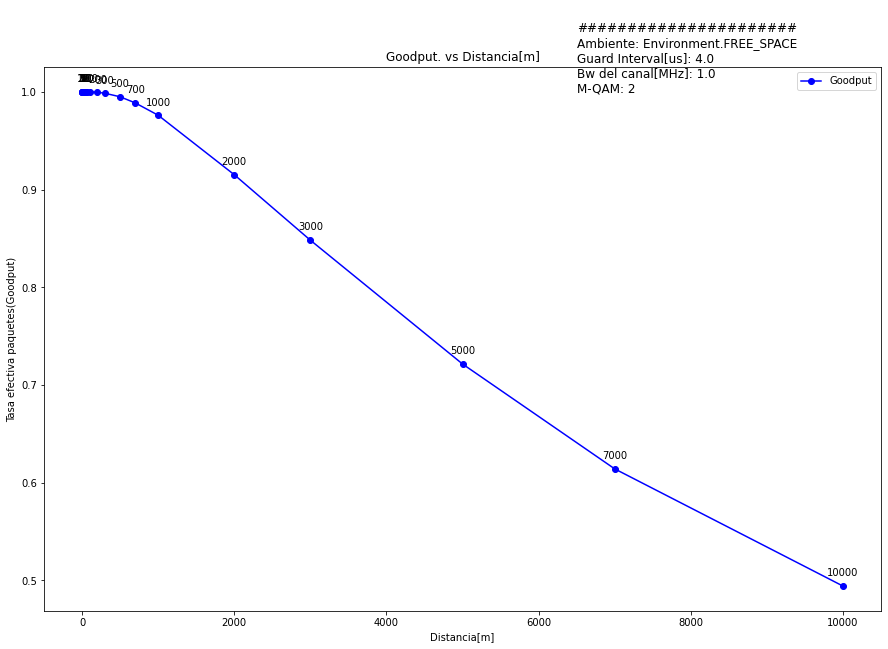

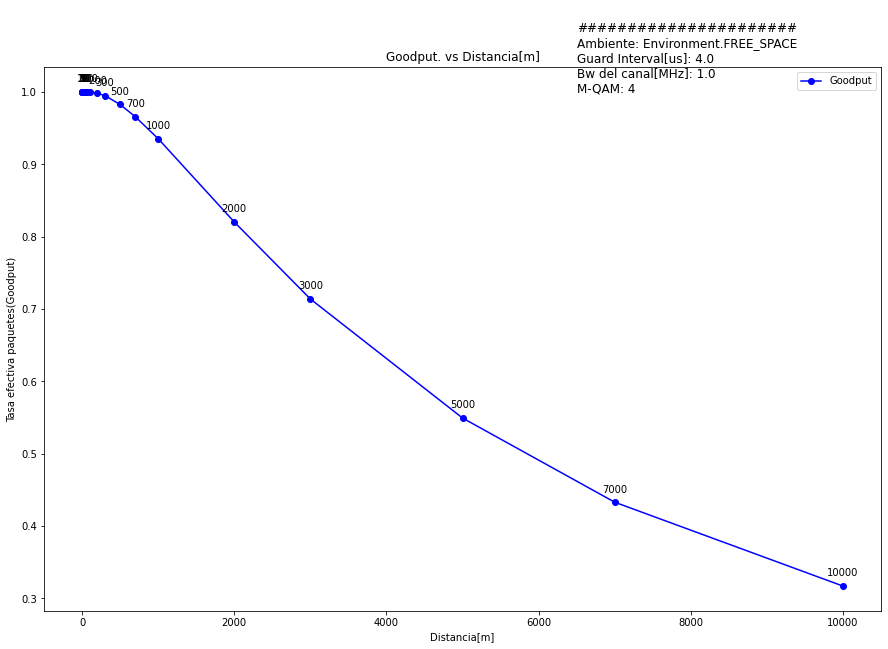

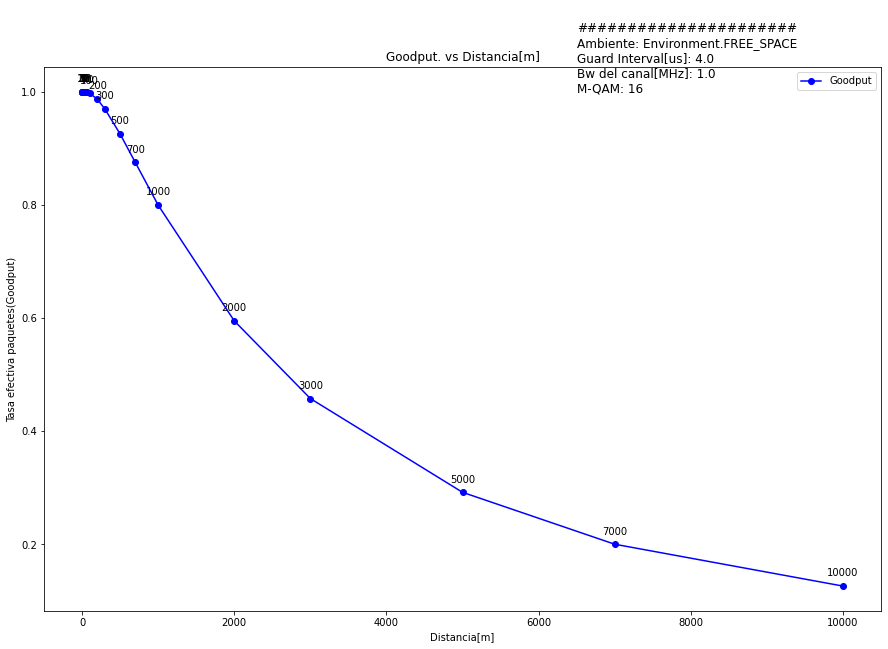

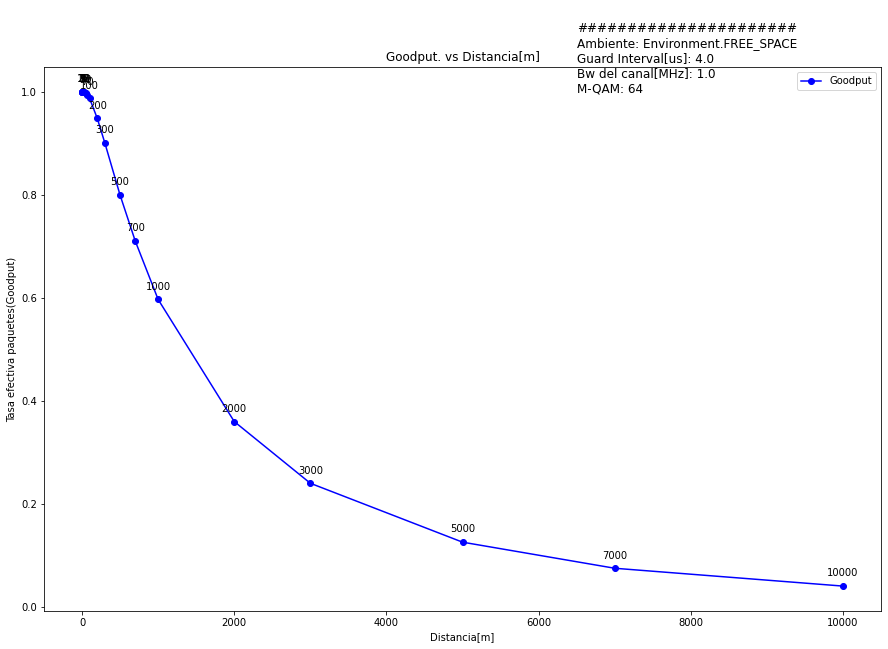

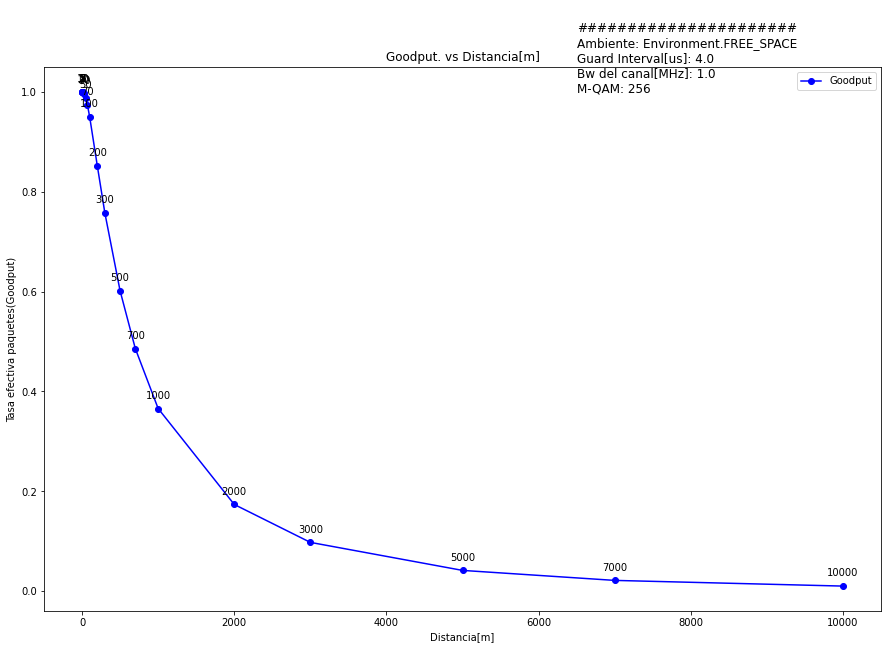

...

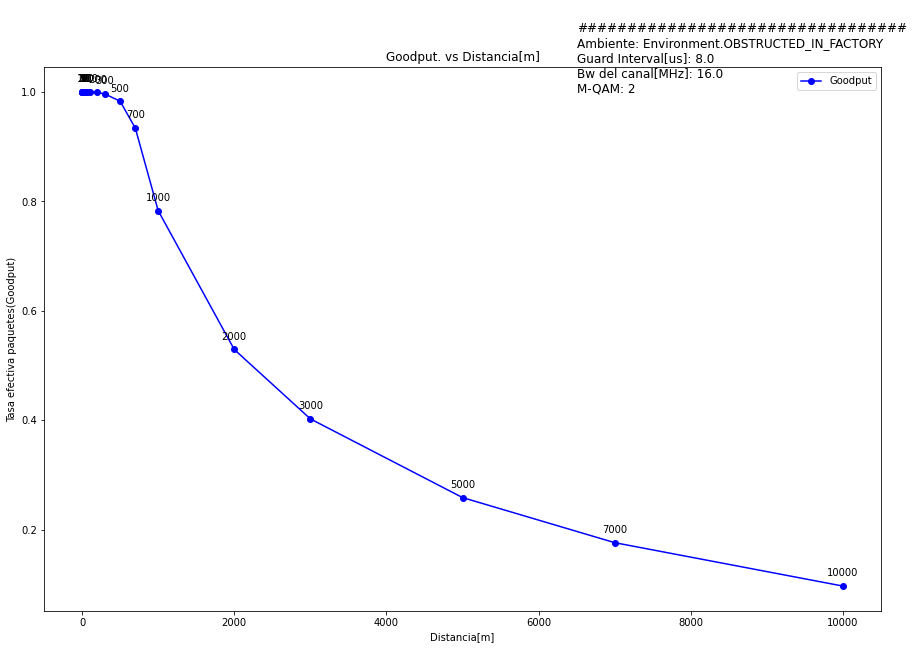

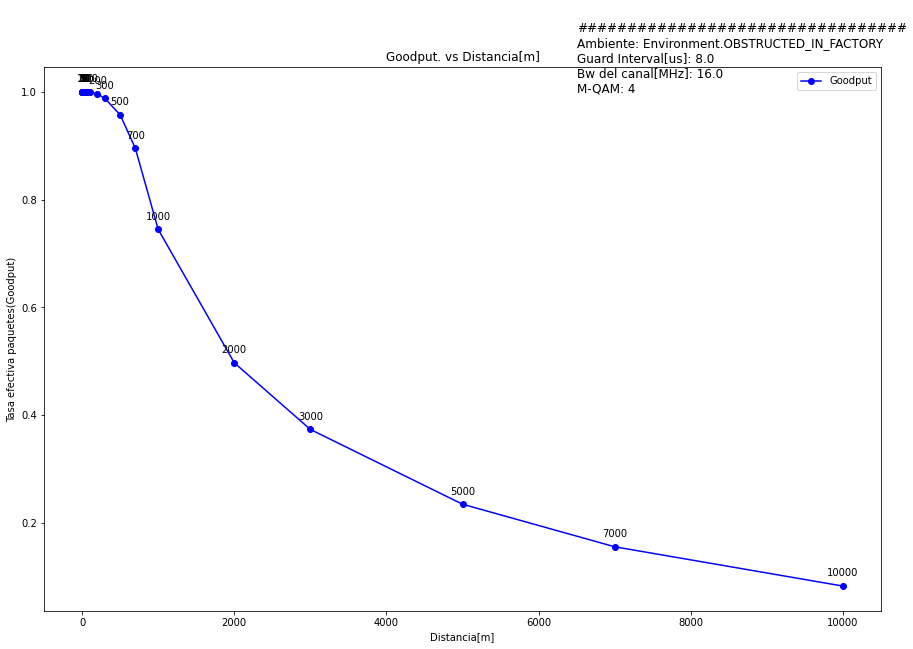

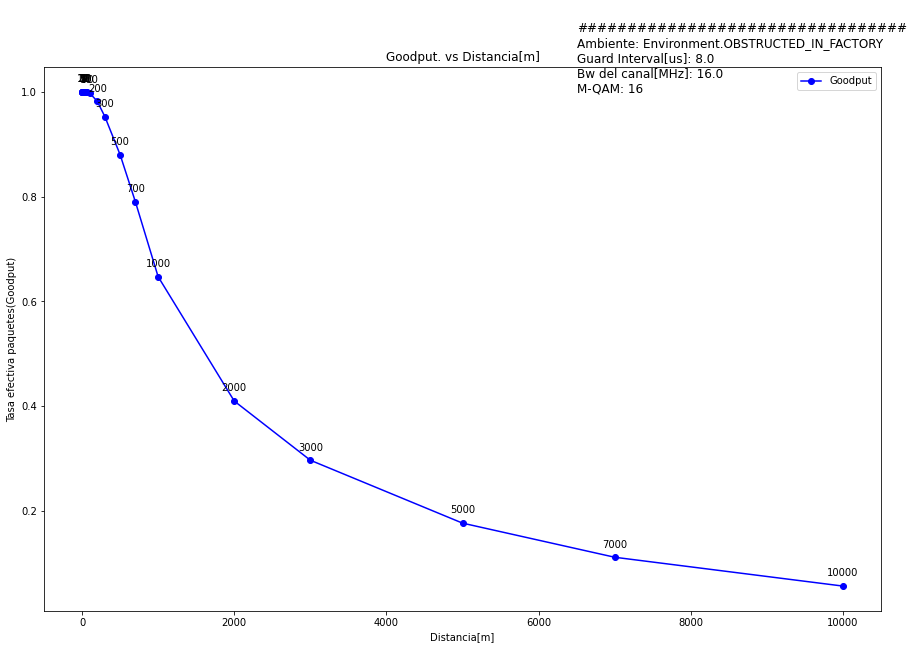

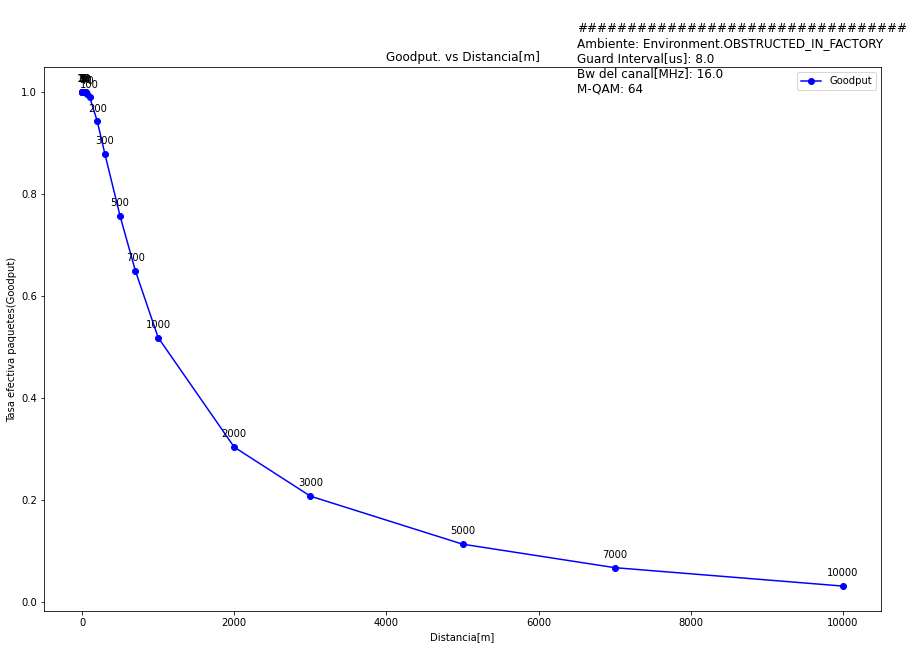

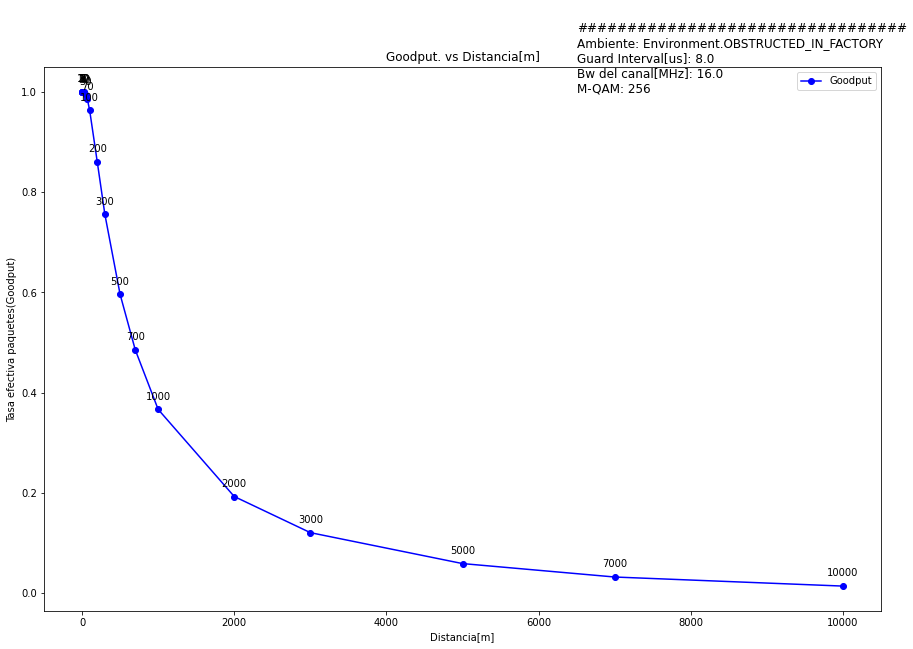

In [27]:
plotAllGraphs(datos)

In [1]:
import pandas as pd
df = pd.read_csv('Resultados/resultData.csv')


In [2]:
df

,enviroment,gi,w,q,x,y
0,Environment.FREE_SPACE,0.000004,1000000.0,2,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.999..."
1,Environment.FREE_SPACE,0.000004,1000000.0,4,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.999994, ..."
2,Environment.FREE_SPACE,0.000004,1000000.0,16,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.999986, 0.999..."
3,Environment.FREE_SPACE,0.000004,1000000.0,64,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 1.0, 0.999998, 1.0, 0.999988, 0.999..."
4,Environment.FREE_SPACE,0.000004,1000000.0,256,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 0.999998, 0.99999, 0.999958, 0.9998..."
...,...,...,...,...,...,...
295,Environment.OBSTRUCTED_IN_FACTORY,0.000008,16000000.0,2,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.999..."
296,Environment.OBSTRUCTED_IN_FACTORY,0.000008,16000000.0,4,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.999..."
297,Environment.OBSTRUCTED_IN_FACTORY,0.000008,16000000.0,16,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.999998, 0.999..."
298,Environment.OBSTRUCTED_IN_FACTORY,0.000008,16000000.0,64,"[1, 2, 3, 5, 7, 10, 20, 30, 50, 70, 100, 200, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.999982, 0.999..."


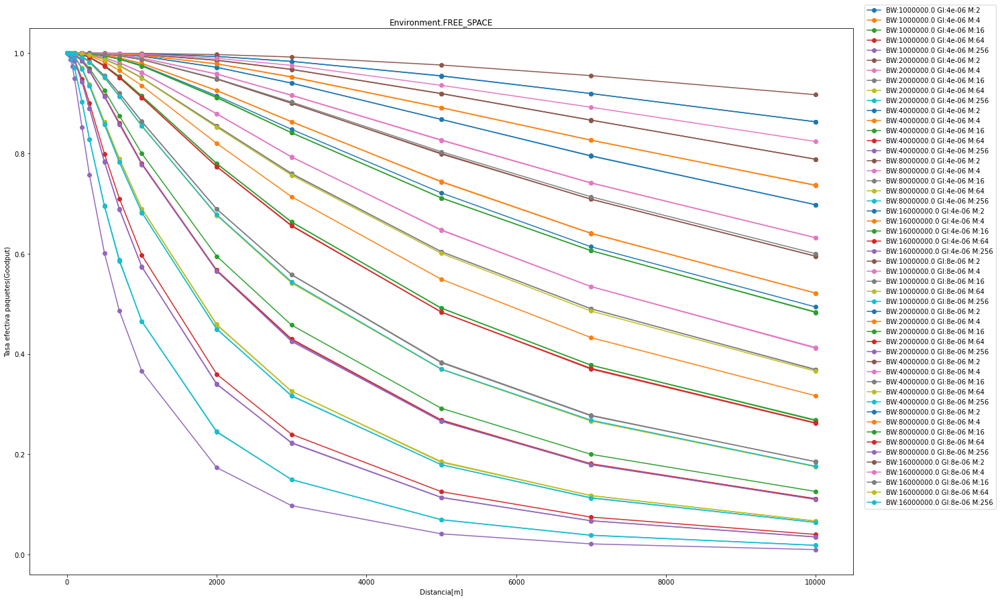

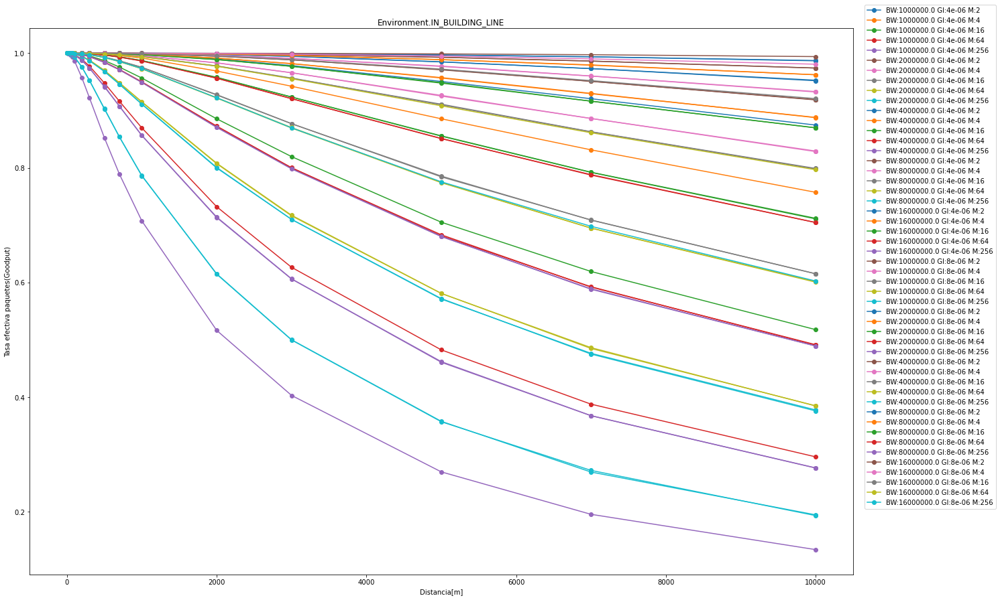

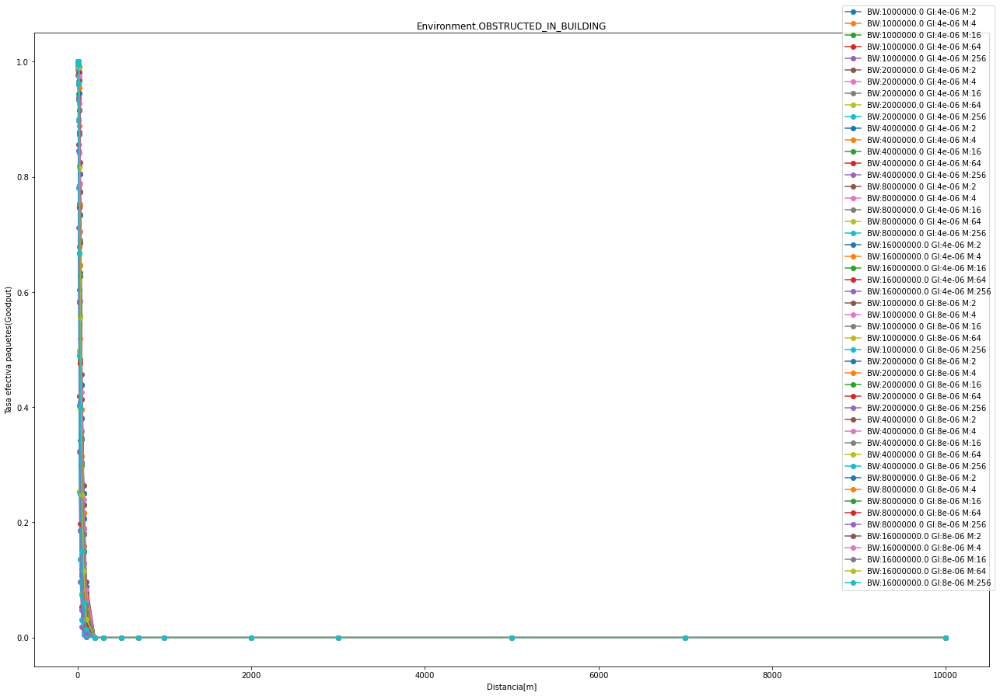

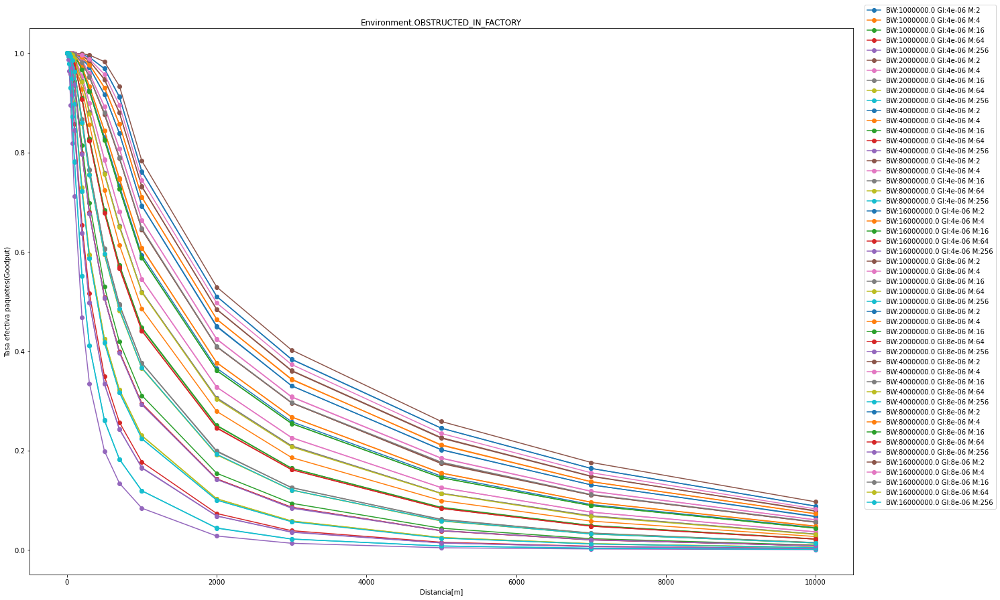

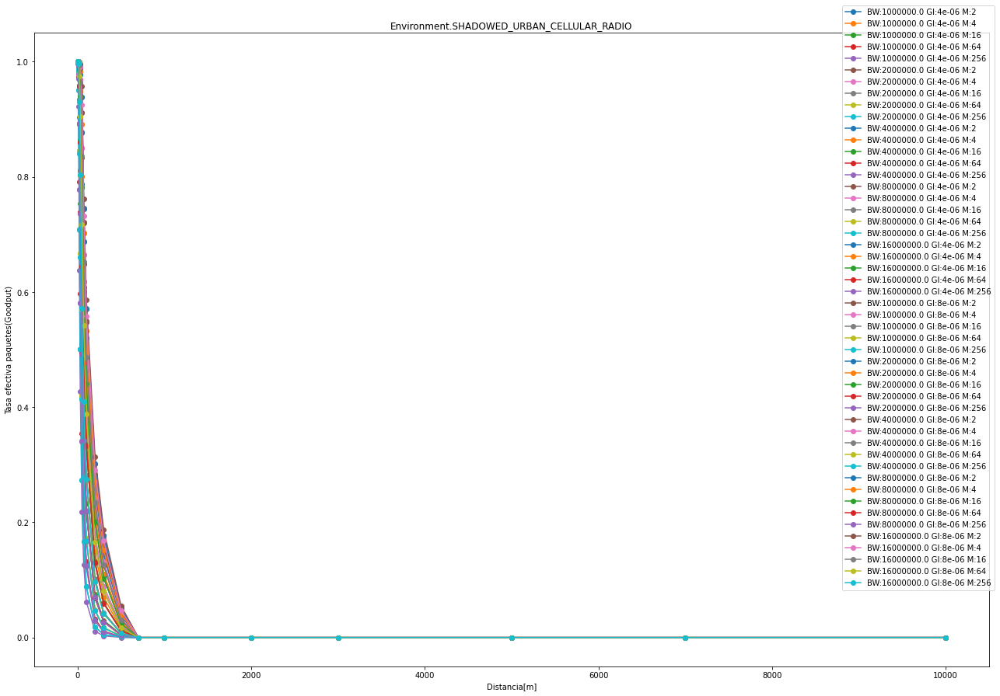

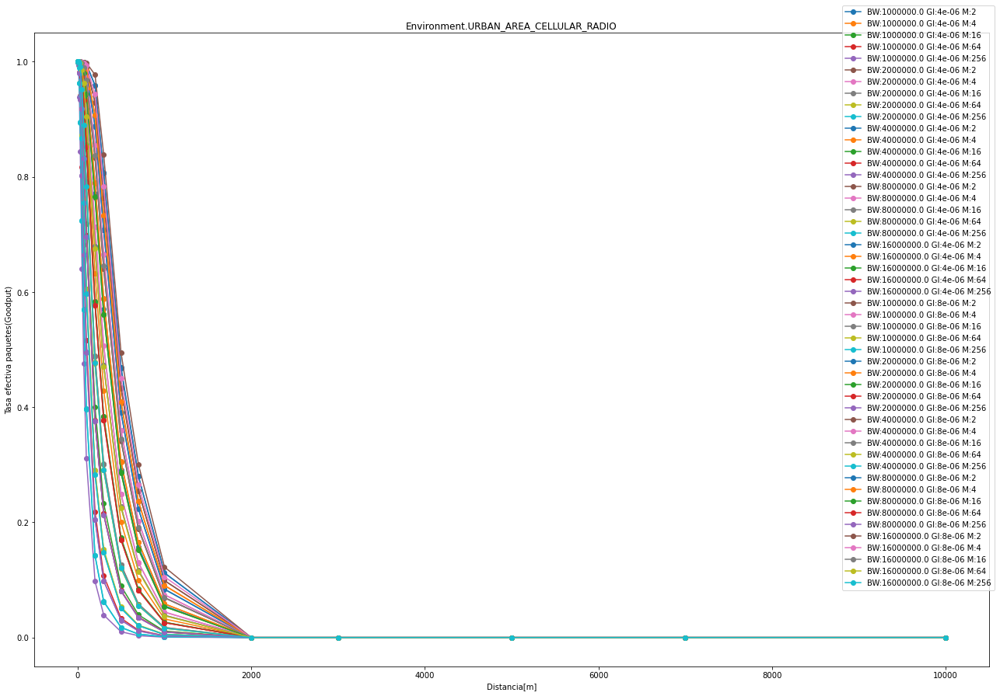

In [5]:
## Obtención de gráficos por ambiente
environmente = ['Environment.FREE_SPACE', 'Environment.IN_BUILDING_LINE','Environment.OBSTRUCTED_IN_BUILDING',
'Environment.OBSTRUCTED_IN_FACTORY','Environment.SHADOWED_URBAN_CELLULAR_RADIO','Environment.URBAN_AREA_CELLULAR_RADIO']
for i in environmente:
    free_space = df[df['enviroment'] == i]
    fig, ax = plt.subplots(figsize=(22,15))

    for i in free_space.values.tolist():
        ax.plot(json.loads(i[4]), json.loads(i[5]), "-o", label=f'BW:{i[2]} GI:{i[1]} M:{i[3]}')  # Plot some data on the axes.
    ax.set_xlabel('Distancia[m]')  # Add an x-label to the axes.
    ax.set_ylabel('Tasa efectiva paquetes(Goodput)')  # Add a y-label to the axes.
    ax.set_title(f"{i[0]}")  # Add a title to the axes.
    ax.legend(bbox_to_anchor=(1.01, 1.05))
    fig.savefig(f'Resultados/{i[0].split(".")[1]}.png', facecolor='white', transparent=False)